# Snow Cover Classifier using Satellite Images
This paper reports the work and the consequent consideration on a satellite images classifier, 
specified on the recognition and the monitoring of land snow cove. Satellite images are from Sentinel 2 Satellite by ESA, 
made available on the Sentinel Hub Platform. For the images storage and pre-processing the library eo-learn is used. 
The classifier is trained and tested with different classifier, trying to obtain the best result in terms of efficiency, 
scalability, and precision and accuracy of the results. Land snow cover of an area and snow cover variation are important 
indicator for different environment aspect, used for useful consideration and prevision. With the work reported in this paper, 
a new algorithm is tested using images from the new European space program for the land monitoring. The resulting classification 
is finally visualized on the map of the area. 

## Necessary import and Set up Environment

In [25]:
# Jupyter notebook related
%reload_ext autoreload
%autoreload 2
%matplotlib inline

# Built-in modules
import os
import datetime
import itertools
from aenum import MultiValueEnum

# Basics of Python data handling and visualization
import numpy as np
np.random.seed(42)
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
from shapely.geometry import Polygon
from tqdm.auto import tqdm

# Machine learning
from sklearn import metrics
from sklearn import preprocessing
from sklearn.model_selection import train_test_split

import pyproj
import shapely
import shapely.ops as ops
from shapely.geometry.polygon import Polygon
from functools import partial
from sentinelhub import CRS

# Imports from eo-learn and sentinelhub-py
from eolearn.core import (
    EOTask,
    EOPatch,
    EOWorkflow,
    FeatureType,
    OverwritePermission,
    LoadTask,
    SaveTask,
    EOExecutor,
    MergeFeatureTask,
)
from eolearn.io import SentinelHubInputTask, VectorImportTask, ExportToTiffTask
from eolearn.geometry import VectorToRasterTask, ErosionTask
from eolearn.features import LinearInterpolationTask, SimpleFilterTask, NormalizedDifferenceIndexTask
from eolearn.ml_tools.sampling import BlockSamplingTask
from sentinelhub import UtmZoneSplitter, DataCollection, UtmGridSplitter, OsmSplitter

Definition of the Path for results and creation of directories if necessary

In [3]:
# Folder where data for running the notebook is stored
DATA_FOLDER = os.path.join(".", "example_data")
# Locations for collected data and intermediate results
EOPATCH_FOLDER = os.path.join(".", "eopatches")
NEW_EOPATCH_FOLDER = os.path.join(".", "new_eopatches")
EOPATCH_SAMPLES_FOLDER = os.path.join(".", "eopatches_sampled")
EOPATCH_TRAINING_FOLDER = os.path.join(".", "eopatches_training")
RESULTS_FOLDER = os.path.join(".", "results")
for folder in (EOPATCH_FOLDER, EOPATCH_SAMPLES_FOLDER, RESULTS_FOLDER):
    os.makedirs(folder, exist_ok=True)

## Preparation of training Data

### Define the Area-of-Interest (AOI):

The area of interest chosen in this project is the "Appennini" mountain in the Modena and Bologna provinces. The geographical shape of the italian provinces was found in the portal <italic> Openpolis </italic> (geojson-italy. (2022). GitHub. Retrieved from https://github.com/openpolis/geojson-italy)

Dimension of the area is 137.03 x 90.07 km2


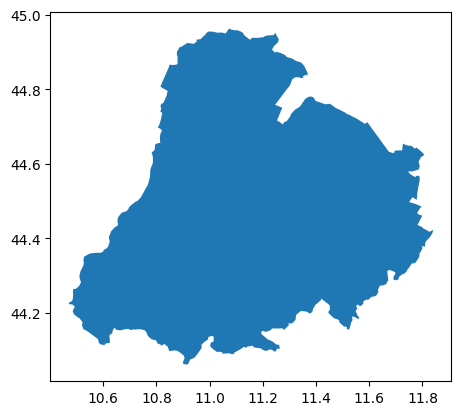

In [4]:
# Load geojson file
province = gpd.read_file(os.path.join(DATA_FOLDER, "province.geojson"))
interest_area = province[(province['prov_name']=='Modena') | (province['prov_name']=='Bologna')]
interest_area = interest_area.dissolve()

# Plot the area of interest
interest_area.plot();

# Get the area's shape in polygon format and print the size
interest_area_shape = interest_area.geometry.values[0]
interest_area_width = (interest_area_shape.bounds[2] - interest_area_shape.bounds[0])*100
interest_area_height = (interest_area_shape.bounds[3] - interest_area_shape.bounds[1])*100

print(f"Dimension of the area is {interest_area_width:.2f} x {interest_area_height:.2f} km2")

Split to a smaller place with focus on the Appennini's mountain area: this allows to avoid the download of a large amount of data related to an area less interested by snow. 


Dimension of the area after splitting to a smaller place is 137.03 x 63.77 km2


/var/folders/_g/754rbb3j56n1t5504zhgm2d40000gn/T/ipykernel_7688/1514388237.py:5: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  interest_area.buffer(500);


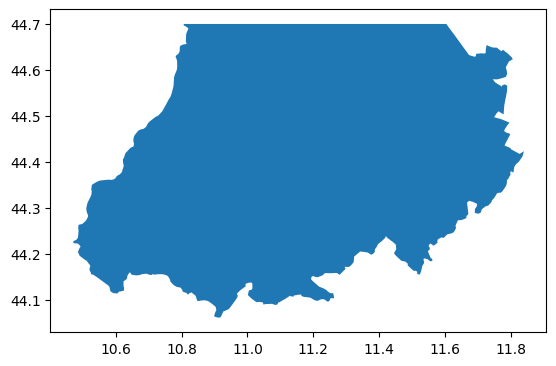

In [5]:
clip_shape = Polygon([(-57.35962388414055, -0.5221310661900134), (-57.35962388414055, 44.7), (79.6701812734866, 44.7), (79.6701812734866, -0.5221310661900134)])
interest_area = interest_area.geometry.clip(clip_shape)

# Add a buffer of 500m to the final selected area and plot it 
interest_area.buffer(500);
interest_area.plot()

# Get the area's shape in polygon format and print the size
interest_area_shape = interest_area.values[0]
interest_area_bounds = interest_area_shape.bounds
interest_area_width = (interest_area_bounds[2] - interest_area_bounds[0])*100
interest_area_height = (interest_area_bounds[3] - interest_area_bounds[1])*100


print(f"Dimension of the area after splitting to a smaller place is {interest_area_width:.2f} x {interest_area_height:.2f} km2")


Following the best practises about the usage of eo-learn tools, the AOI is now splitted in boxes that will be filled with the specific data from the Sentinel-Hub portal.

In [6]:
bbox_splitter = OsmSplitter([interest_area_shape], CRS.WGS84, zoom_level=11)
bbox_list = np.array(bbox_splitter.get_bbox_list())
info_list = np.array(bbox_splitter.get_info_list())

geometry = [Polygon(bbox.get_polygon()) for bbox in bbox_list]
idxs = [i for i, p in enumerate(bbox_list)]
idxs_x = [info["index_x"] for info in info_list]
idxs_y = [info["index_y"] for info in info_list]

bbox_gdf = gpd.GeoDataFrame({"index": idxs, "index_x": idxs_x, "index_y": idxs_y}, crs=interest_area.crs, geometry=geometry)

Display the obtained boxes over the the AOI

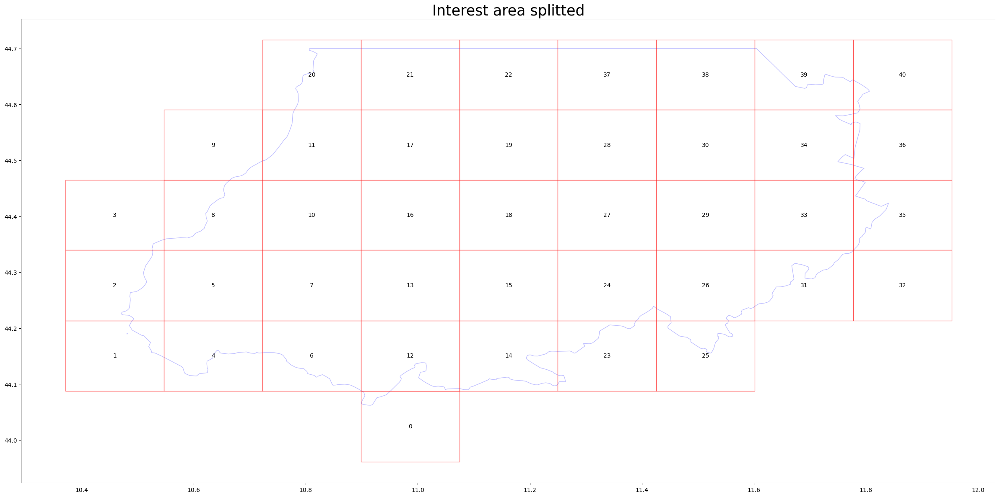

In [7]:
# Display bboxes over country
fig, ax = plt.subplots(figsize=(30, 30))
ax.set_title("Interest area splitted", fontsize=25)
interest_area.plot(ax=ax, facecolor="w", edgecolor="b", alpha=0.5)
bbox_gdf.plot(ax=ax, facecolor="w", edgecolor="r", alpha=0.5, aspect=1)

for index, bbox in zip(idxs, bbox_list):
    geo = bbox.geometry
    ax.text(geo.centroid.x, geo.centroid.y, index, ha="center", va="center")

A regular-shape area is defined: it helps to have a better visualization of images and a better management of boxes.

In [8]:
# Manually select a rectangular area where focus the attention. 
focus_list=[9, 11, 17, 19, 28, 30, 8, 10, 16, 18, 27, 29, 5, 7, 13, 15, 24, 26, 4, 6, 12, 14, 23, 25]

In [9]:
# Save to shapefile
shapefile_name = "grid_appennino.gpkg"
bbox_gdf.to_file(os.path.join(RESULTS_FOLDER, shapefile_name), driver="GPKG")

### Obtain the Training data
Training data are obtained by the Sentinel-Hub portal that offer the download of a limited set of images for free after registration. In order to allow the autentication, a secret key obtained by the user account portal on sentinel-hub.com needs to be presented to the portal that respond with an authentication token: the secret key and the credential must be setted in Python client configuration. 

Beyond the donload, data are analyzed: the followong function uses Sen2Cor's classification map to labeled pixels as cloud or not-cloud (Sentinel2 cloud-detector. (2022). GitHub. Retrieved from https://github.com/sentinel-hub/sentinel2-cloud-detector).

In [9]:
# Define the classes who build a functional mask for valid and invalid pixels on the satellite images
# @author  https://github.com/sentinel-hub/eo-learn-examples/tree/main/land-cover-map 

class SentinelHubValidDataTask(EOTask):
    """
    Combine Sen2Cor's classification map with `IS_DATA` to define a `VALID_DATA_SH` mask
    The SentinelHub's cloud mask is asumed to be found in eopatch.mask['CLM']
    """

    def __init__(self, output_feature):
        self.output_feature = output_feature

    def execute(self, eopatch):
        eopatch[self.output_feature] = eopatch.mask["IS_DATA"].astype(bool) & (~eopatch.mask["CLM"].astype(bool))
        return eopatch

The following function just count the aount of the pixels that are not labeled as cloud or invalid by Sentinel-hub funtionality.

In [ ]:
class AddValidCountTask(EOTask):
    """
    The task counts number of valid observations in time-series and stores the results in the timeless mask.
    """

    def __init__(self, count_what, feature_name):
        self.what = count_what
        self.name = feature_name

    def execute(self, eopatch):
        eopatch[FeatureType.MASK_TIMELESS, self.name] = np.count_nonzero(eopatch.mask[self.what], axis=0)
        return eopatch

The request to the sentinel-hub portal is now prepared: we will donwload only 7 bands among the 12 available. 

In [11]:
# Add a request for S2 bands adding the pre-built filter of cloudy scenes;
# The s2cloudless masks and probabilities are requested via additional data.
# @author  https://github.com/sentinel-hub/eo-learn-examples/tree/main/land-cover-map 
band_names = ["B02", "B03", "B04", "B06", "B08", "B11", "B12"]
add_data = SentinelHubInputTask(
    bands_feature=(FeatureType.DATA, "BANDS"),
    bands=band_names,
    resolution=50,
    maxcc=0.8,
    time_difference=datetime.timedelta(minutes=120),
    data_collection=DataCollection.SENTINEL2_L1C,
    additional_data=[(FeatureType.MASK, "dataMask", "IS_DATA"), (FeatureType.MASK, "CLM"), (FeatureType.DATA, "CLP")],
    max_threads=5,
)

The selected bands allow us to obtain new features applying normalization to the difference of valued between two different values. The meaning of the new features is reported in the project report.

In [ ]:
''' 
    CALCULATING NEW FEATURES

    NDVI -> (B08 - B04)/(B08 + B04)
    NDWI -> (B03 - B08)/(B03 + B08)
    NDBI -> (B11 - B08)/(B11 + B08)
    NDSI -> (B04 - B06)/(B04 + B06)
    
'''

ndvi = NormalizedDifferenceIndexTask(
    (FeatureType.DATA, "BANDS"), (FeatureType.DATA, "NDVI"), [band_names.index("B08"), band_names.index("B04")]
)
ndwi = NormalizedDifferenceIndexTask(
    (FeatureType.DATA, "BANDS"), (FeatureType.DATA, "NDWI"), [band_names.index("B03"), band_names.index("B08")]
)
ndbi = NormalizedDifferenceIndexTask(
    (FeatureType.DATA, "BANDS"), (FeatureType.DATA, "NDBI"), [band_names.index("B11"), band_names.index("B08")]
)
ndsi = NormalizedDifferenceIndexTask(
    (FeatureType.DATA, "BANDS"), (FeatureType.DATA, "NDSI"), [band_names.index("B04"), band_names.index("B06")]
)

The cloud labeling and the valid pixels count functions are added to the task flow.

In [ ]:
# VALIDITY MASK
# Validate pixels using SentinelHub's cloud detection mask and region of acquisition
# @author  https://github.com/sentinel-hub/eo-learn-examples/tree/main/land-cover-map 

add_sh_validmask = SentinelHubValidDataTask((FeatureType.MASK, "IS_VALID"))

# COUNTING VALID PIXELS
# Count the number of valid observations per pixel using valid data mask
# @author  https://github.com/sentinel-hub/eo-learn-examples/tree/main/land-cover-map 

add_valid_count = AddValidCountTask("IS_VALID", "VALID_COUNT")

# SAVING TO OUTPUT (if needed)
save = SaveTask(EOPATCH_FOLDER, overwrite_permission=OverwritePermission.OVERWRITE_PATCH)

In [12]:
# Define the workflow
workflow_nodes = linearly_connect_tasks(
    add_data, ndvi, ndwi, ndbi, ndsi, add_sh_validmask, add_valid_count, save
)
workflow = EOWorkflow(workflow_nodes)

The time interval chosen for the training is the winter 2019-2020.

In [ ]:
%%time

time_interval = ["2019-11-01", "2020-05-31"]

input_node = workflow_nodes[0]
save_node = workflow_nodes[-1]
execution_args = []
for idx, bbox in enumerate(bbox_list):
    execution_args.append(
        {
            input_node: {"bbox": bbox, "time_interval": time_interval},
            save_node: {"eopatch_folder": f"eopatch_{idx}"},
        }
    )


executor = EOExecutor(workflow, execution_args, save_logs=True)
executor.run()

# UNCOMMENT TO PRINT A HTML REPORT 
#executor.make_report()

failed_ids = executor.get_failed_executions()
if failed_ids:
    raise RuntimeError(
        f"Execution failed EOPatches with IDs:\n{failed_ids}\n"
        f"For more info check report at {executor.get_report_path()}"
    )

### Visualize the obtained data
To visualize the obtained data in human-friendly way, we print a RGB map.

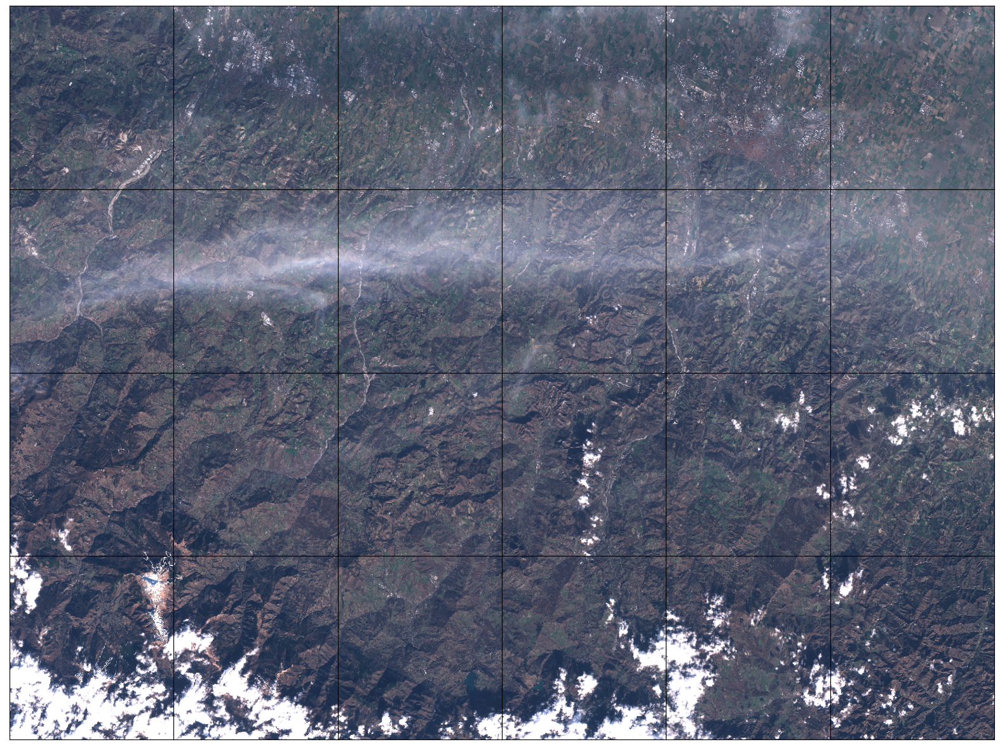

In [8]:
# Visualize the RGB images 

fig, axs = plt.subplots(nrows=4, ncols=6, figsize=(20, 15))

date = datetime.datetime(2020, 2, 14)

for i, patchID in enumerate(focus_list):
    eopatch_path = os.path.join(EOPATCH_FOLDER, f"eopatch_{patchID}")
    eopatch = EOPatch.load(eopatch_path, lazy_loading=True)

    dates = np.array([timestamp.replace(tzinfo=None) for timestamp in eopatch.timestamp])
    closest_date_id = np.argsort(abs(date - dates))[0]

    ax = axs[i // 6][i % 6]
    ax.imshow(np.clip(eopatch.data["BANDS"][closest_date_id][..., [2, 1, 0]] * 3.5, 0, 1))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("auto")
    del eopatch

fig.subplots_adjust(wspace=0, hspace=0)

To appreciate effects of cloud cleaning, let’s analyze the mean of the NDVI index: it represents the mean of the amount of vegetation of the area; we expect a linear trend over the time period, just lower during the winter.

/var/folders/xs/t7zlfsks6b39kzq8lv38yfr80000gn/T/ipykernel_3531/2957280191.py:16: RuntimeWarning: Mean of empty slice
  ndvi_mean_clean = np.nanmean(ndvi_clean.reshape(t, w * h), axis=1)


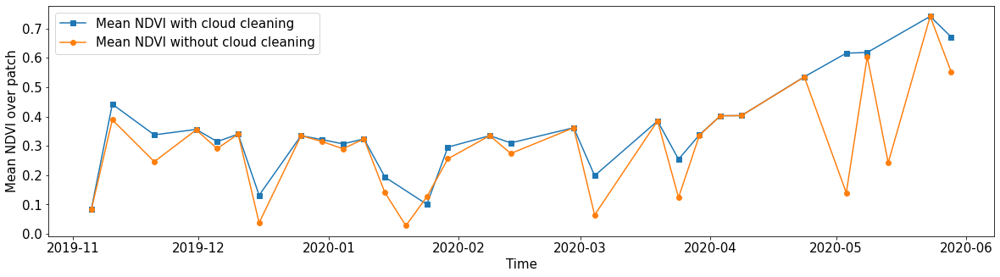

In [9]:
# Visualize the variation of values applying the cloud cleaning

eID = 16
eopatch = EOPatch.load(os.path.join(EOPATCH_FOLDER, f"eopatch_{i}"), lazy_loading=True)

ndvi = eopatch.data["NDVI"]
mask = eopatch.mask["IS_VALID"]
time = np.array(eopatch.timestamp)
t, w, h, _ = ndvi.shape

ndvi_clean = ndvi.copy()
ndvi_clean[~mask] = np.nan  # Set values of invalid pixels to NaN's

# Calculate means, remove NaN's from means
ndvi_mean = np.nanmean(ndvi.reshape(t, w * h), axis=1)
ndvi_mean_clean = np.nanmean(ndvi_clean.reshape(t, w * h), axis=1)
time_clean = time[~np.isnan(ndvi_mean_clean)]
ndvi_mean_clean = ndvi_mean_clean[~np.isnan(ndvi_mean_clean)]

fig = plt.figure(figsize=(20, 5))
plt.plot(time_clean, ndvi_mean_clean, "s-", label="Mean NDVI with cloud cleaning")
plt.plot(time, ndvi_mean, "o-", label="Mean NDVI without cloud cleaning")
plt.xlabel("Time", fontsize=15)
plt.ylabel("Mean NDVI over patch", fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

plt.legend(loc=2, prop={"size": 15});

Linearity is lost without cloud cleaning, because values are not reliable clouds cover the ground. 

It is relevant and interesting to visualize the NDVI map for the vegetation and the NDSI map for the snow: the meaning of the new features is reported in the project report.

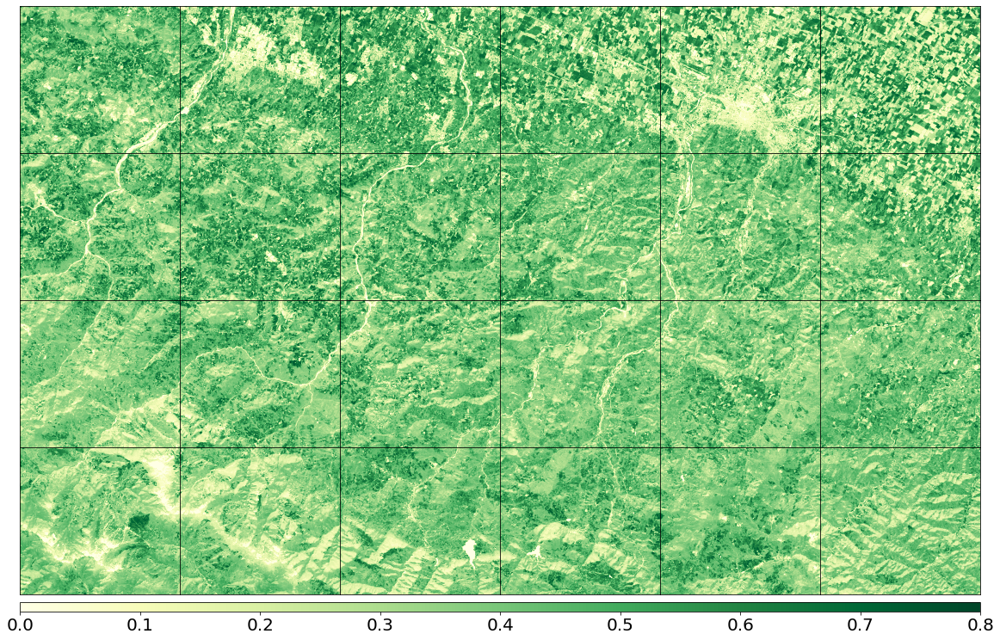

In [127]:
# Drow the NDVI parameters of the are of interest

fig, axs = plt.subplots(nrows=4, ncols=6, figsize=(20, 15))

for i, patchID in enumerate(focus_list):
    eopatch_path = os.path.join(EOPATCH_FOLDER, f"eopatch_{patchID}")
    eopatch = EOPatch.load(eopatch_path, lazy_loading=True)
    ndvi = eopatch.data["NDVI"]
    mask = eopatch.mask["IS_VALID"]
    ndvi[~mask] = np.nan
    ndvi_mean = np.nanmean(ndvi, axis=0).squeeze()

    ax = axs[i // 6][i % 6]
    im = ax.imshow(ndvi_mean, vmin=0, vmax=0.8, cmap=plt.get_cmap("YlGn"))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("auto")
    del eopatch

fig.subplots_adjust(wspace=0, hspace=0)

cb = fig.colorbar(im, ax=axs.ravel().tolist(), orientation="horizontal", pad=0.01, aspect=100)
cb.ax.tick_params(labelsize=20)
plt.show()

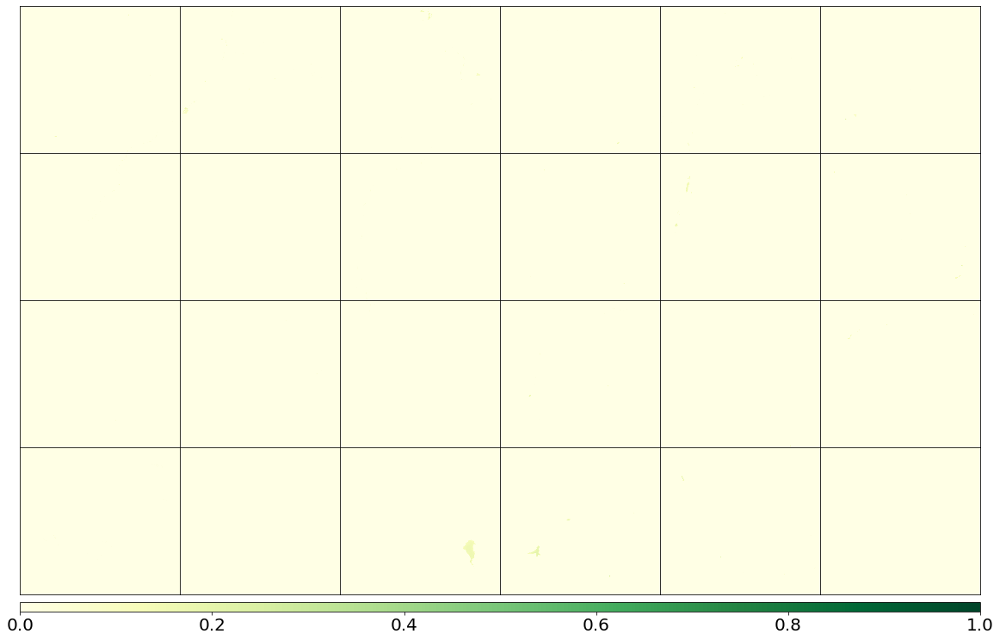

In [205]:
fig, axs = plt.subplots(nrows=4, ncols=6, figsize=(20, 15))

for i, patchID in enumerate(focus_list):
    eopatch_path = os.path.join(EOPATCH_FOLDER, f"eopatch_{patchID}")
    eopatch = EOPatch.load(eopatch_path, lazy_loading=True)
    ndvi = eopatch.data["NDSI"]
    mask = eopatch.mask["IS_VALID"]
    ndvi[~mask] = np.nan
    ndvi_mean = np.nanmean(ndvi, axis=0).squeeze()

    ax = axs[i // 6][i % 6]
    im = ax.imshow(ndvi_mean, vmin=0, vmax=1, cmap=plt.get_cmap("YlGn"))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("auto")
    del eopatch

fig.subplots_adjust(wspace=0, hspace=0)

cb = fig.colorbar(im, ax=axs.ravel().tolist(), orientation="horizontal", pad=0.01, aspect=100)
cb.ax.tick_params(labelsize=20)
plt.show()

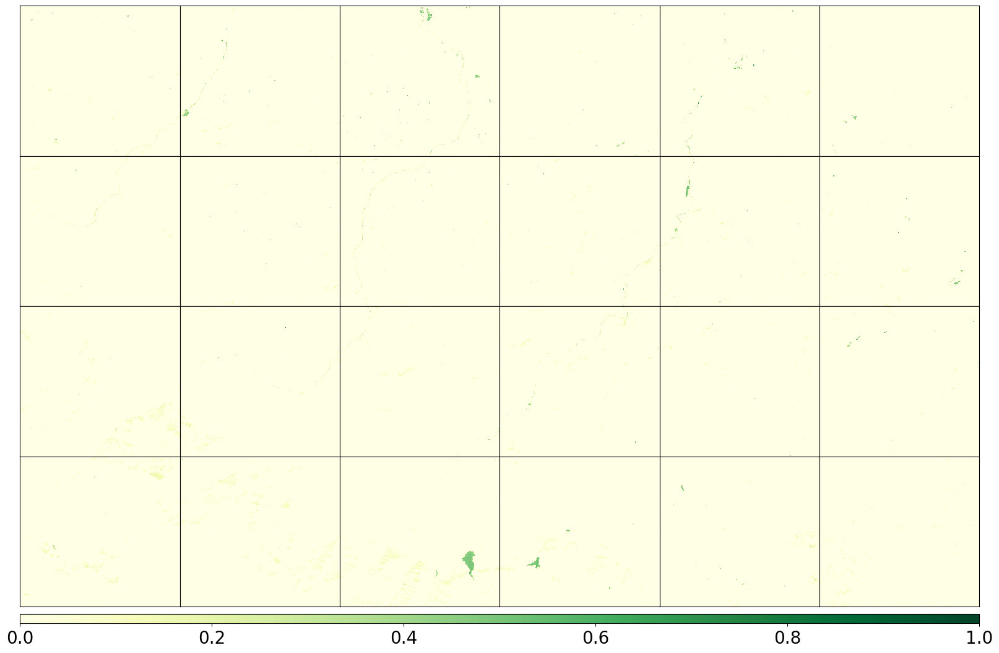

In [10]:
fig, axs = plt.subplots(nrows=4, ncols=6, figsize=(20, 15))

for i, patchID in enumerate(focus_list):
    eopatch_path = os.path.join(EOPATCH_FOLDER, f"eopatch_{patchID}")
    eopatch = EOPatch.load(eopatch_path, lazy_loading=True)
    ndvi = eopatch.data["NDWI"]
    mask = eopatch.mask["IS_VALID"]
    ndvi[~mask] = np.nan
    ndvi_mean = np.nanmean(ndvi, axis=0).squeeze()

    ax = axs[i // 6][i % 6]
    im = ax.imshow(ndvi_mean, vmin=0, vmax=1, cmap=plt.get_cmap("YlGn"))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("auto")
    del eopatch

fig.subplots_adjust(wspace=0, hspace=0)

cb = fig.colorbar(im, ax=axs.ravel().tolist(), orientation="horizontal", pad=0.01, aspect=100)
cb.ax.tick_params(labelsize=20)
plt.show()

Finally the cloud probability map, calculated using values defined as cloud by the s2cloudless software.

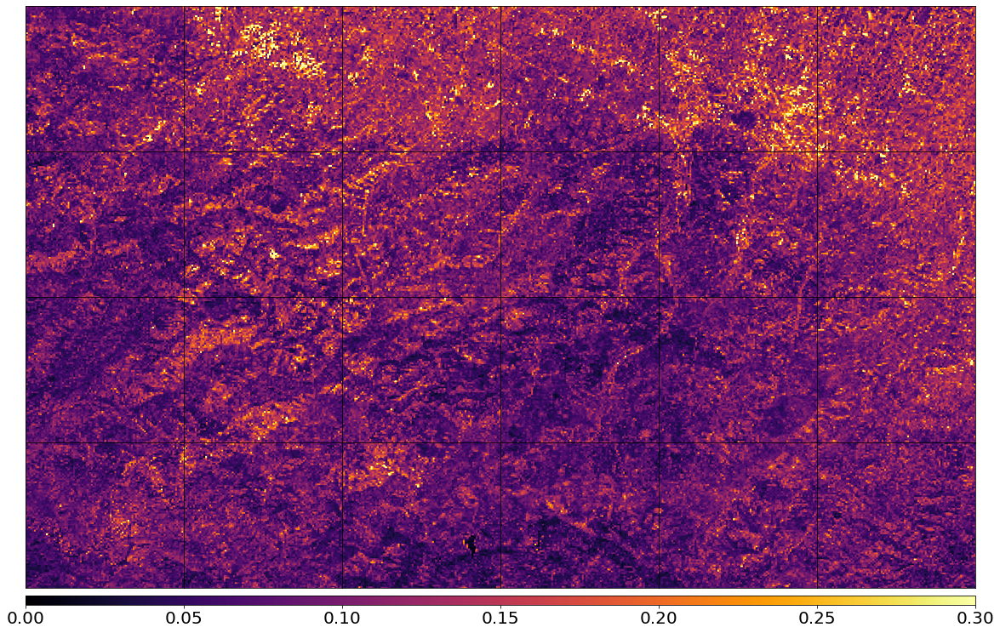

In [11]:
# cloud probability

fig, axs = plt.subplots(nrows=4, ncols=6, figsize=(20, 15))

for i, patchID in enumerate(focus_list):
    eopatch_path = os.path.join(EOPATCH_FOLDER, f"eopatch_{patchID}")
    eopatch = EOPatch.load(eopatch_path, lazy_loading=True)
    clp = eopatch.data["CLP"].astype(float) / 255
    mask = eopatch.mask["IS_VALID"]
    clp[~mask] = np.nan
    clp_mean = np.nanmean(clp, axis=0).squeeze()

    ax = axs[i // 6][i % 6]
    im = ax.imshow(clp_mean, vmin=0.0, vmax=0.3, cmap=plt.cm.inferno)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("auto")
    del eopatch

fig.subplots_adjust(wspace=0, hspace=0)

cb = fig.colorbar(im, ax=axs.ravel().tolist(), orientation="horizontal", pad=0.01, aspect=100)
cb.ax.tick_params(labelsize=20)
plt.show()

## Obtain the ground truth data
Ground truth data are obtained from the maps elaborated by AERPAE integrating satellite images from NASA to data from metereological station on the territory.
Data have different resolution and a diferent reference system. To have a corrispondence with Sentinel-hub data, we need to have a transformation of the available maps: first of all we define a function that applys a mask to maps and give back a image with specified dimensions, and another function that transforms the reference system.

In [10]:
# Necessary imports
import fiona
import rasterio
from rasterio.mask import mask
import pyproj
from shapely.geometry import MultiPolygon
import re

In [11]:
"""Apply a mask to a raster image.


    Parameters
    ----------
    raster_file : str
       path to the raster file
    shape_mask : Shapely.Geometry
        shape of the mask
    sixe_x: int
        dimension x of the output image in pixels
    sixe_y: int
        dimension y of the output image in pixels

    Outupt
    ------
    out_image: raster
        raster imge elaborated.

    out_meta: map{string: value}
        meta information of the raster image

    @davide.tazzioli@studio.unibo.it
"""
def applyMask(raster_file, shape_mask, size_x, size_y):
    with rasterio.open(raster_file) as src:
        out_image, out_transform = mask(src, shape_mask, crop=True, nodata=None)
        out_meta = src.meta.copy()

    out_meta.update({"driver": "GTiff",
                    "height": size_y,
                    "width": size_x,
                    "transform": out_transform})

    return out_image, out_meta


In [12]:
"""Translate coordinatio from crs:4326 to crs:32632.

    Parameters
    ----------
    geometry: Shapely.Geometry
        input shape to translate

    Outupt
    ------
    MultyPolygon: Shapely.MultyPolygon
        output shape elaborated.

    <davide.tazzioli@studio.unibo.it>
"""
def translateCoordinate(geometry):
    proj = pyproj.Transformer.from_crs(4326, 32632, always_xy=True)
    shape_points = []
    for xx, yy in geometry.exterior.coords:
        shape_points.append(proj.transform(xx, yy))
    return MultiPolygon([Polygon(shape_points)])

In [30]:
''' The following instructions adapt the groud truth images to the bboxes, 
    in order to have a 1-to-1 correspondence between sampled data from Sentinel-hub 
    and ground truth data. 

    <davide.tazzioli@studio.unibo.it>
'''

# CONSTANT paths
GROUND_TRUTH = os.path.join(".", "truth_data")
ELABORATED_GROUND_TRUTH = os.path.join(".", "elaborated_ground_truth")
os.makedirs(ELABORATED_GROUND_TRUTH, exist_ok=True)
files = os.listdir(GROUND_TRUTH)

for index, filename in enumerate(files):
    if filename.rsplit(".")[-1] != "tiff":
        continue
    #print("Replicating pixels of file "+filename, end="")
    percent = int(index*100/len(files))
    print("REPLICATING PIXELS: [" + "="*int(percent/5) + " "*(20-int(percent/5))+"] " + str(percent) +"% "+filename, end="")
    # PREPARE THE OUTPUT FOLDER
    output_path = os.path.join(ELABORATED_GROUND_TRUTH, str("real_data_" + filename.rsplit(".")[0]))
    os.makedirs(output_path, exist_ok=True)

    for box in focus_list:
        # shape_mask is the bbox
        shape_mask = translateCoordinate(bbox_gdf[bbox_gdf['index']==box].geometry.item())
        sample_path = os.path.join('eopatches_sampled', f"eopatch_{box}")
        bbox_meta = EOPatch.load(sample_path, lazy_loading=True).meta_info

        # Apply mask
        raster_img, raster_img_meta = applyMask(os.path.join(GROUND_TRUTH, filename), shape_mask.geoms, bbox_meta['size_x'], bbox_meta['size_y'])

        # Calculate padding to fulfill the bbox
        pad_width = int((bbox_meta['size_x'] - (raster_img.shape[1]*8)-1)/2)
        pad_height = int((bbox_meta['size_y'] - (raster_img.shape[2]*8)-1)/2)
        
        # Prepare the output image
        raster_out = np.full((1, bbox_meta['size_x'], bbox_meta['size_y']), -1) #NO DATA

        # Replicate valid pixels
        for index, value in np.ndenumerate(raster_img):
            if value == 0:         #SNOW
                for column in range(0, 8):
                    for row in range (0, 8):
                        raster_out[(index[0], pad_width+(index[1]*8)+column, pad_height+(index[2]*8)+row)] = 1 
            elif value == 1:       #CLOUD 
                for column in range(0, 8):
                    for row in range (0, 8):
                        raster_out[(index[0], pad_width+(index[1]*8)+column, pad_height+(index[2]*8)+row)] = -1 # NO DATA: we don't use this cloud classification..
            elif value == -1:      # LAND
                for column in range(0, 8):
                    for row in range (0, 8):
                        raster_out[(index[0], pad_width+(index[1]*8)+column, pad_height+(index[2]*8)+row)] = 0 

        with rasterio.open(os.path.join(output_path, str('bbox_'+str(box)+'.tiff')), "w", **raster_img_meta) as dest:
            dest.write(raster_out)
    print("\r", end="")

print("REPLICATE PIXELS: Done.                                                     ")

REPLICATE PIXELS: Done.                                                     


## Prepare the training and test sets 


In order to use the eo-learn tools, the ground truth data are added to eo-patches. 

In [31]:
''' 
    Add the real data to the eo_patches

    -1  -> NO DATA
    0   -> LAND  
    1   -> SNOW
    2   -> ICE CLOUD
    
'''

for box in focus_list:
    sample_path = os.path.join(EOPATCH_FOLDER, f"eopatch_{box}")
    eopatch = EOPatch.load(sample_path, lazy_loading=True)
    eopatch.data['LABEL'] = np.full((len(eopatch.timestamp), eopatch.meta_info['size_y'], eopatch.meta_info['size_x'], 1), 0)
    eopatch.mask_timeless['REAL_DATA_SNOW_COUNT'] = np.full((len(eopatch.timestamp), 1, 1), 0)
    for day_index, day in enumerate(eopatch.timestamp):
        day_of_year = day.timetuple().tm_yday

        # for some reason, data obtained from ARPAE elaboration arrived only to the April 16th. 
        # I managed the problem in the easiest way... <@dt>
        if day_of_year>106:
            continue

        year = day.year
        raster_folder = str('real_data_'+str(year)+str(day_of_year).zfill(3))
        with rasterio.open(os.path.join(ELABORATED_GROUND_TRUTH, os.path.join(raster_folder, str('bbox_'+str(box)+'.tiff'))), 'r') as src:
            labels = src.read()
        eopatch.data['LABEL'][day_index] = np.transpose(labels, (1, 2, 0))
        eopatch.mask_timeless['REAL_DATA_SNOW_COUNT'][day_index] = [np.count_nonzero(labels==1)]

    eopatch.save(os.path.join(NEW_EOPATCH_FOLDER, str('eopatch_'+str(box))), overwrite_permission=OverwritePermission.OVERWRITE_PATCH)


Groud truth data maps contain a cloud classification; we will then compare the classification with the one obtained with the eo-learn instruments. A difference is expected because the low definition of the gound truth data maps. We can keep only the oe-learn classification because is more defined.

In [46]:
for box in focus_list:
    sample_path = os.path.join(NEW_EOPATCH_FOLDER, f"eopatch_{box}")
    eopatch = EOPatch.load(sample_path, lazy_loading=True)
    #eopatch.data['LABEL'] 
    count = 0
    for index, value in np.ndenumerate(eopatch.mask["CLM"]):
        if value == 1: 
            eopatch.data['LABEL'][index] = 2
            #eopatch.data['LABEL'][index] = 2
            count += 1
    eopatch.save(os.path.join(NEW_EOPATCH_FOLDER, str('eopatch_'+str(box))), overwrite_permission=OverwritePermission.OVERWRITE_PATCH)
print("cloud pixels: ", count)


cloud pixels:  988731


To create a regular dataset, features are made uniforms and concatenated.

In [48]:
# LOAD EXISTING EOPATCHES
load = LoadTask(NEW_EOPATCH_FOLDER)
# FEATURE CONCATENATION
concatenate = MergeFeatureTask({FeatureType.DATA: [ 'BANDS', 'NDBI', 'NDVI', 'NDWI']},(FeatureType.DATA, 'FEATURES'))
# SAVING
save = SaveTask(EOPATCH_SAMPLES_FOLDER, overwrite_permission=OverwritePermission.OVERWRITE_PATCH)

# Define the workflow
workflow_nodes = linearly_connect_tasks(load, concatenate, save) 
workflow = EOWorkflow(workflow_nodes)

In [96]:
# SVC is so slow... maybe a try with less features? 
# NO! actually the speed of SVC is related to the number of training samples...

'''
# LOAD EXISTING EOPATCHES
load = LoadTask(NEW_EOPATCH_FOLDER)
# FEATURE CONCATENATION
concatenate = MergeFeatureTask({FeatureType.DATA: [ "BANDS"]},(FeatureType.DATA, 'FEATURES'))
# SAVING
save = SaveTask(EOPATCH_SAMPLES_FOLDER, overwrite_permission=OverwritePermission.OVERWRITE_PATCH)

# Define the workflow
workflow_nodes = linearly_connect_tasks(load, concatenate, save) 
workflow = EOWorkflow(workflow_nodes)
'''

In [49]:
%%time

execution_args = []
for idx in focus_list:
    execution_args.append(
        {
            workflow_nodes[0]: {"eopatch_folder": f"eopatch_{idx}"},  # load
            workflow_nodes[-1]: {"eopatch_folder": f"eopatch_{idx}"},  # save
        }
    )

executor = EOExecutor(workflow, execution_args, save_logs=True)
executor.run()

executor.make_report()

failed_ids = executor.get_failed_executions()
if failed_ids:
    raise RuntimeError(
        f"Execution failed EOPatches with IDs:\n{failed_ids}\n"
        f"For more info check report at {executor.get_report_path()}"
    )

100%|██████████| 24/24 [00:11<00:00,  2.01it/s]

CPU times: user 1.6 s, sys: 21.1 s, total: 22.7 s
Wall time: 12 s



/opt/homebrew/lib/python3.10/site-packages/eolearn/visualization/eoexecutor.py:57: EOUserWarning: failed to execute PosixPath('dot'), make sure the Graphviz executables are on your systems' PATH.
Please install the system package 'graphviz' (in addition to the python package) to have the dependency graph in the final report!
  warnings.warn(


### Improve the value of positive data
Sampling data can help training algorithm to be more efficient; in the work contest of this project, particularly, most of data are cloud or land, with just a little percent of snow, centered in the Appennini’s mountain. A first data cleaning consists in deleting all the parts of maps in all the time spot where there is no snow: the effect of this operation is to obtain a smaller dataset, where snow, cloud and land pixels are more balanced.

In [50]:
count_land = 0
count_snow = 0
count_cloud = 0
for box in focus_list:
    sample_path = os.path.join(EOPATCH_SAMPLES_FOLDER, f"eopatch_{box}")
    eopatch = EOPatch.load(sample_path, lazy_loading=True)
    count_land += np.count_nonzero(eopatch.data['LABEL']==0)
    count_snow += np.count_nonzero(eopatch.data['LABEL']==1)
    count_cloud += np.count_nonzero(eopatch.data['LABEL']==2)

valid_pixels = count_snow+count_cloud+count_land
print("Snow Pixel are the {:.2f}% of the total of valid pixels".format(count_snow*100/valid_pixels))
print("Land Pixel are the {:.2f}% of the total of valid pixels".format(count_land*100/valid_pixels))
print("Cloud Pixel are the {:.2f}% of the total of valid pixels".format(count_cloud*100/valid_pixels))

Snow Pixel are the 0.14% of the total of valid pixels
Land Pixel are the 69.59% of the total of valid pixels
Cloud Pixel are the 30.27% of the total of valid pixels


In [55]:
# Keep only days with at least 500 snow pixels
for box in focus_list:
    sample_path = os.path.join(EOPATCH_SAMPLES_FOLDER, f"eopatch_{box}")
    eopatch = EOPatch.load(sample_path, lazy_loading=True)

    for snow_pixels_index in reversed(range(0, len(eopatch.mask_timeless['REAL_DATA_SNOW_COUNT']))):
        if eopatch.mask_timeless['REAL_DATA_SNOW_COUNT'][snow_pixels_index][0][0] < 1000:
            eopatch.data['FEATURES'] = np.delete(eopatch.data['FEATURES'], snow_pixels_index, 0)
            eopatch.data['LABEL'] = np.delete(eopatch.data['LABEL'], snow_pixels_index, 0)
    eopatch.save(os.path.join(EOPATCH_TRAINING_FOLDER, str('eopatch_'+str(box))), overwrite_permission=OverwritePermission.OVERWRITE_PATCH)
    

In [56]:
count_land = 0
count_snow = 0
count_cloud = 0
for box in focus_list:
    sample_path = os.path.join(EOPATCH_TRAINING_FOLDER, f"eopatch_{box}")
    eopatch = EOPatch.load(sample_path, lazy_loading=True)
    count_land += np.count_nonzero(eopatch.data['LABEL']==0)
    count_snow += np.count_nonzero(eopatch.data['LABEL']==1)
    count_cloud += np.count_nonzero(eopatch.data['LABEL']==2)
    
valid_pixels = count_snow+count_cloud+count_land
print("After optimization, snow pixel are the {:.2f}% of the total of valid pixels".format(count_snow*100/valid_pixels))
print("After optimization, land pixel are the {:.2f}% of the total of valid pixels".format(count_land*100/valid_pixels))
print("After optimization, cloud pixel are the {:.2f}% of the total of valid pixels".format(count_cloud*100/valid_pixels))

After optimization, snow pixel are the 9.94% of the total of valid pixels
After optimization, land pixel are the 73.83% of the total of valid pixels
After optimization, cloud pixel are the 16.23% of the total of valid pixels


A further sampling with no criteria on the selected images keeps only the 60% of data.

In [82]:
# LOAD EXISTING EOPATCHES
load_2 = LoadTask(EOPATCH_TRAINING_FOLDER)
# SPATIAL SAMPLIG OF 5% OF DATA because Support Vector Classifier is very slow
spatial_sampling = BlockSamplingTask([(FeatureType.DATA, "FEATURES", "FEATURES_SAMPLED"), (FeatureType.DATA, "LABEL", "LABEL_SAMPLED")], 0.6)
#SAVING
save_2 = SaveTask(EOPATCH_TRAINING_FOLDER, overwrite_permission=OverwritePermission.OVERWRITE_PATCH)
# define a new workflow
workflow_nodes_2 = linearly_connect_tasks(load_2, spatial_sampling, save_2)
workflow_2 = EOWorkflow(workflow_nodes_2)

In [83]:
%%time

execution_args = []
for idx in focus_list:
    execution_args.append(
        {
            workflow_nodes_2[0]: {"eopatch_folder": f"eopatch_{idx}"},  # load
            workflow_nodes_2[-1]: {"eopatch_folder": f"eopatch_{idx}"},  # save
        }
    )

executor_2 = EOExecutor(workflow_2, execution_args, save_logs=True)
executor_2.run()

#executor_2.make_report()

failed_ids = executor_2.get_failed_executions()
if failed_ids:
    raise RuntimeError(
        f"Execution failed EOPatches with IDs:\n{failed_ids}\n"
        f"For more info check report at {executor.get_report_path()}"
    )

100%|██████████| 24/24 [00:07<00:00,  3.33it/s]

CPU times: user 850 ms, sys: 11.5 s, total: 12.4 s
Wall time: 7.21 s


In [84]:
# Load sampled eopatches
sampled_eopatches = []

for i in focus_list:
    sample_path = os.path.join(EOPATCH_TRAINING_FOLDER, f"eopatch_{i}")
    sampled_eopatches.append(EOPatch.load(sample_path, lazy_loading=True))

# Set the features and the labels for train and test sets
features = []
labels = []
num_data = 0
for eopatch in sampled_eopatches:
    for timestamp in range(0, len(eopatch.data['FEATURES_SAMPLED'])):
        num_data+=1
        features.append(eopatch.data["FEATURES_SAMPLED"][timestamp])
        labels.append(eopatch.data['LABEL_SAMPLED'][timestamp])
    
X = np.concatenate(features)
y = np.concatenate(labels)

In [85]:
print('Shape of features dataset: \t' + str(X.shape))
print('Shape of labels dataset: \t' + str(y.shape))

Shape of features dataset: 	(756916, 1, 10)
Shape of labels dataset: 	(756916, 1, 1)


The dataset has 3 dimension: even if we concatenated features, a flat dimension is still present.

In [86]:
X = X.reshape(X.shape[0], X.shape[-1])
y= y.reshape(y.shape[0], y.shape[-1])
print('Shape of features dataset after reshaping: \t' + str(X.shape))
print('Shape of labels dataset after reshaping: \t' + str(y.shape))

Shape of features dataset after reshaping: 	(756916, 10)
Shape of labels dataset after reshaping: 	(756916, 1)


Any of the satellite images from Sentinel-II have missing data; labels contain a filling pad, previously added, containing the value -1: data have to be cleaned from invalid entries before the training phase.

In [87]:
rows_with_NaN = np.shape(X[np.isnan(X).any(axis=1), :])[0]
labels_NaN = np.shape(y[y==-1])[0]


print("There are {:.0f} rows containing NaN value in the features dataset".format(rows_with_NaN))
print("There are {:.0f} rows containing -1 in labels in the training dataset".format(labels_NaN))

There are 186757 rows containing NaN value in the features dataset
There are 323535 rows containing -1 in labels in the training dataset


In [88]:
# Remove rows containing NaN values
ds_complete_ = np.append(X, y, 1)
ds_complete_ = ds_complete_[~np.isnan(ds_complete_).any(axis=1), :]
ds_complete_ = ds_complete_[ds_complete_[:, -1]!=-1]

X = np.delete(ds_complete_, -1, 1)
y = ds_complete_[:, -1]

rows_with_NaN = np.shape(X[np.isnan(X).any(axis=1), :])[0]
labels_NaN = np.shape(y[y==-1])[0]


print("After cleaning, there are {:.0f} rows containing NaN value in the features dataset".format(rows_with_NaN))
print("After cleaning, there are {:.0f} rows containing -1 in label of the training dataset".format(labels_NaN))

After cleaning, there are 0 rows containing NaN value in the features dataset
After cleaning, there are 0 rows containing -1 in label of the training dataset


In [89]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=1/5.0, random_state=8)
print('The training dataset contains {:.2f}% of total entries. '.format(X_train.shape[0] * 100 / (X_train.shape[0] + X_test.shape[0])))

The training dataset contains 80.00% of total entries. 


In [90]:
print(X_train.shape)
print(np.unique(y_train))

(300490, 10)
[0. 1. 2.]


## Train and Test the model
### Define utilities functions
The optimal choice of a classifier and the correct parameters heavily depends on the application and the specific case of interest. In order to optimise these choices, several experiments are now performed, trying to find the best classifier and tune the parameters to obtain the best results. The choice of the best classifier will be done manually, exploring the precision and f1-score: a useful function prints the results and the scikit-learn classification report.


In [72]:
"""
http://scikit-learn.org/stable/auto_examples/model_selection/plot_grid_search_digits.html
@author: scikit-learn.org and Claudio Sartori
"""
import warnings
warnings.filterwarnings('ignore') # uncomment this line to suppress warnings

from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.svm import SVC
from sklearn.linear_model import Perceptron
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
import numpy as np
print(__doc__) # print information included in the triple quotes at the beginning

random_state = 15
np.random.seed(random_state)


http://scikit-learn.org/stable/auto_examples/model_selection/plot_grid_search_digits.html
@author: scikit-learn.org and Claudio Sartori



In [61]:
'''
       Code from Data Mining M 2020-2021 course material
       Professor Claudio Sartori - University of Bologna
       https://www.unibo.it/en/teaching/course-unit-catalogue/course-unit/2020/391683
       
'''
# The code below is intended to ease the remainder of the exercise
model_lbls = [
             'dt', 
             'nb', 
              'lp', 
              'rndf',
              'svc',
            ]

# Set the parameters to be explored by the grid for each classifier
tuned_param_dt = [{'max_depth': list(range(1, 5))}]
tuned_param_nb = [{'var_smoothing': [10, 1, 1e-1, 1e-2, 1e-3, 1e-4, 1e-5, 1e-6, 1e-07, 1e-8, 1e-9, 1e-10]}]
tuned_param_lp = [{'early_stopping': [True]}]
tuned_param_svc = [{'kernel': ['rbf'], 
                    'gamma': ['scale'],
                    'C': [1, 10],
                    },
                    {'kernel': ['linear'],
                     'C': [1, 10, 100],                     
                    },
                   ]
tuned_param_knn =[{'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]}]
tuned_param_rndf = [{'max_depth': list(range(1, 25))}]

# set the models to be fitted specifying name, estimator and parameter structure
models = {
    'dt': {'name': 'Decision Tree       ',
           'estimator': DecisionTreeClassifier(), 
           'param': tuned_param_dt,
          },
    'nb': {'name': 'Gaussian Naive Bayes',
           'estimator': GaussianNB(),
           'param': tuned_param_nb
          },
    'lp': {'name': 'Linear Perceptron   ',
           'estimator': Perceptron(),
           'param': tuned_param_lp,
          },
    'svc':{'name': 'Support Vector      ',
           'estimator': SVC(), 
           'param': tuned_param_svc
          },
    'knn':{'name': 'K Nearest Neighbor ',
           'estimator': KNeighborsClassifier(),
           'param': tuned_param_knn
        
    },
    'rndf':{'name': 'Random Forest Classifier',
              'estimator': RandomForestClassifier(),
              'param': tuned_param_rndf,
    },
}

# scores to be explored
scores = [
          'precision', 
          # 'recall',
         ]

In [47]:
'''Print a detailed report 

    Parameters
    ----------
    model: 
       istance of fitted estimator

    Outupt
    ------

'''
'''
       Code from Data Mining M 2020-2021 course material
       Professor Claudio Sartori - University of Bologna
       https://www.unibo.it/en/teaching/course-unit-catalogue/course-unit/2020/391683
       
'''
def print_results(model, file = None):
    print("Best parameters set found on train set:")
    print()
    # if best is linear there is no gamma parameter
    print(model.best_params_)
    print()
    print("Grid scores on train set:")
    print()
    means = model.cv_results_['mean_test_score']
    stds = model.cv_results_['std_test_score']
    params = model.cv_results_['params']
    for mean, std, params_tuple in zip(means, stds, params):
        print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params_tuple))
    print()
    print("Detailed classification report for the best parameter set:")
    print()
    print("The model is trained on the full train set.")
    print("The scores are computed on the full test set.")
    print()
    y_true, y_pred = y_test, model.predict(X_test)
    print(classification_report(y_true, y_pred))
    print()
    if file is not None:
        file.write("Best parameters set found on train set:\n")
        file.write('\n')
        file.write(str(model.best_params_)+'\n')
        file.write('\n')
        file.write("Grid scores on train set:\n")
        file.write('\n')
        for mean, std, params_tuple in zip(means, stds, params):
            file.write("%0.3f (+/-%0.03f) for %r"
                % (mean, std * 2, params_tuple)+'\n')
        file.write('\n')
        file.write("Detailed classification report for the best parameter set:\n")
        file.write('\n')
        file.write("The model is trained on the full train set.\n")
        file.write("The scores are computed on the full test set.\n")
        file.write('\n')
        file.write(classification_report(y_true, y_pred)+'\n')
        file.write('\n')

In [ ]:

'''
       Code from Data Mining M 2020-2021 course material
       Professor Claudio Sartori - University of Bologna
       https://www.unibo.it/en/teaching/course-unit-catalogue/course-unit/2020/391683
       
''' 
results_short = {}

for score in scores:
    print('='*40)
    print("# Tuning hyper-parameters for %s" % score)
    print()
    with open(os.path.join(RESULTS_FOLDER, "classification_results.txt"), 'w+') as classification_results_output:
        classification_results_output.write('='*40+'\n')
        classification_results_output.write("# Tuning hyper-parameters for %s \n" % score)
        classification_results_output.write('\n')
    #'%s_macro' % score ## is a string formatting expression
    # the parameter after % is substituted in the string placeholder %s
    for m in model_lbls:
        print('-'*40)
        print("Trying model {}".format(models[m]['name']))
        start = datetime.datetime.now()
        clf = GridSearchCV(models[m]['estimator'], models[m]['param'], cv=5,
                           scoring='%s_macro' % score, 
#                            iid = False, 
                           return_train_score = False,
                           n_jobs = 2, # this allows using multi-cores
                           )
        clf.fit(X_train, y_train)
        with open(os.path.join(RESULTS_FOLDER, "classification_results.txt"), 'w+') as classification_results_output:
            classification_results_output.write('-'*40+'\n')
            classification_results_output.write("Trying model {} \n".format(models[m]['name']))
            classification_results_output.write('\n')
            print_results(clf, classification_results_output)
            results_short[m] = clf.best_score_
            execution_time = datetime.datetime.now() - start
            print()
            print('execution time : '+ str(execution_time))
            print()
            classification_results_output.write('\n')
            classification_results_output.write('execution time : '+ str(execution_time)+'\n')
            classification_results_output.write('\n')

    with open(os.path.join(RESULTS_FOLDER, "classification_results.txt"), 'a+') as classification_results_output:
        print("Summary of results for {}".format(score))
        print("Estimator")
        classification_results_output.write("Summary of results for " + str(score)+'\n')
        classification_results_output.write('Estimator \n')

        for m in results_short.keys():
            print("{}\t - score: {:5.2f}%".format(models[m]['name'], results_short[m]*100))
            classification_results_output.write("{}\t - score: {:5.2f}%".format(models[m]['name'], results_short[m]*100)+'\n')

In [13]:
with open(os.path.join(RESULTS_FOLDER, 'classification_results.txt')) as classification_results_output:
    print(classification_results_output.read())

# Tuning hyper-parameters for precision

----------------------------------------
Trying model Decision Tree

Best parameters set found on train set:

{'max_depth': 9}

Grid scores on train set:

0.242 (+/-0.000) for {'max_depth': 1}
0.496 (+/-0.003) for {'max_depth': 2}
0.752 (+/-0.003) for {'max_depth': 3}
0.745 (+/-0.009) for {'max_depth': 4}
0.763 (+/-0.017) for {'max_depth': 5}
0.776 (+/-0.004) for {'max_depth': 6}
0.780 (+/-0.011) for {'max_depth': 7}
0.783 (+/-0.005) for {'max_depth': 8}
0.790 (+/-0.008) for {'max_depth': 9}
0.789 (+/-0.007) for {'max_depth': 10}
0.788 (+/-0.006) for {'max_depth': 11}
0.784 (+/-0.005) for {'max_depth': 12}
0.779 (+/-0.005) for {'max_depth': 13}
0.773 (+/-0.004) for {'max_depth': 14}
0.766 (+/-0.006) for {'max_depth': 15}
0.761 (+/-0.006) for {'max_depth': 16}
0.754 (+/-0.006) for {'max_depth': 17}
0.749 (+/-0.006) for {'max_depth': 18}
0.743 (+/-0.007) for {'max_depth': 19}
0.738 (+/-0.009) for {'max_depth': 20}
0.733 (+/-0.007) for {'max_depth'

In [14]:
with open(os.path.join(RESULTS_FOLDER, 'classification_results.txt')) as classification_results_output:
    print_line=False
    while line:=classification_results_output.readline():
        if "Summary of results for" in line:
            print_line = True
        if print_line:
            print(line)

Summary of results for precision

Estimators

Decision Tree       	 - score: 79.04%

Gaussian Naive Bayes	 - score: 75.42%

Linear Perceptron   	 - score: 76.66%

Random Forest Classifier	 - score: 81.75%

Support Vector      	 - score: 81.54%







Best parameters: RandomForestClassifier, max depth= 17

## Validate the model
In order to understand the behavior of the selected model, and to increase the value of the classifier, an in depth analyzes is applied to the classification results.

In [91]:
model = RandomForestClassifier(max_depth = 17)
model.fit(X_train, y_train)

RandomForestClassifier(max_depth=17)

In [92]:
y_test_predicted = model.predict(X_test)

In [93]:
class_labels = np.unique(y_test)
class_names = ['land', 'snow', 'ice cloud']
mask = np.in1d(y_test_predicted, y_test)
predictions = y_test_predicted[mask]
true_labels = y_test[mask]

# Extract and display metrics
f1_scores = metrics.f1_score(true_labels, predictions, labels=class_labels, average=None)
avg_f1_score = metrics.f1_score(true_labels, predictions, average="weighted")
recall = metrics.recall_score(true_labels, predictions, labels=class_labels, average=None)
precision = metrics.precision_score(true_labels, predictions, labels=class_labels, average=None)
accuracy = metrics.accuracy_score(true_labels, predictions)

print("Classification accuracy {:.1f}%".format(100 * accuracy))
print("Classification F1-score {:.1f}%".format(100 * avg_f1_score))
print()
print("             Class              =  F1  | Recall | Precision")
print("         --------------------------------------------------")
for idx, lulctype in enumerate([class_names[index] for index in range(0, len(class_labels))]):
    line_data = (lulctype, f1_scores[idx] * 100, recall[idx] * 100, precision[idx] * 100)
    print("         * {0:20s} = {1:2.1f} |  {2:2.1f}  | {3:2.1f}".format(*line_data))

Classification accuracy 89.2%
Classification F1-score 88.3%

             Class              =  F1  | Recall | Precision
         --------------------------------------------------
         * land                 = 92.9 |  95.6  | 90.4
         * snow                 = 45.5 |  35.6  | 63.0
         * ice cloud            = 89.6 |  88.3  | 91.0


Print and plot the confusion matrix.

In [94]:
'''Print and Plot the confusion matrix.

    Parameters
    ----------
    confusion_matrix: metrics.confusion_matrix

    classes: int
        number of possible classes
    normalize: Bool
        apply normalization
    title: String
        title of the plot
    cmap:
        color map 
    ylabel: String

    xlabel: String
        
    filename: 

    Outupt
    ------
    none


'''
def plot_confusion_matrix(
    confusion_matrix,
    classes,
    normalize=False,
    title="Confusion matrix",
    cmap=plt.cm.Blues,
    ylabel="True label",
    xlabel="Predicted label",
    filename=None,
):
    np.set_printoptions(precision=2, suppress=True)

    if normalize:
        normalisation_factor = confusion_matrix.sum(axis=1)[:, np.newaxis] + np.finfo(float).eps
        confusion_matrix = confusion_matrix.astype("float") / normalisation_factor

    plt.imshow(confusion_matrix, interpolation="nearest", cmap=cmap, vmin=0, vmax=1)
    plt.title(title, fontsize=20)
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90, fontsize=20)
    plt.yticks(tick_marks, classes, fontsize=20)

    fmt = ".2f" if normalize else "d"
    threshold = confusion_matrix.max() / 2.0
    for i, j in itertools.product(range(confusion_matrix.shape[0]), range(confusion_matrix.shape[1])):
        plt.text(
            j,
            i,
            format(confusion_matrix[i, j], fmt),
            horizontalalignment="center",
            color="white" if confusion_matrix[i, j] > threshold else "black",
            fontsize=12,
        )

    plt.tight_layout()
    plt.ylabel(ylabel, fontsize=20)
    plt.xlabel(xlabel, fontsize=20)

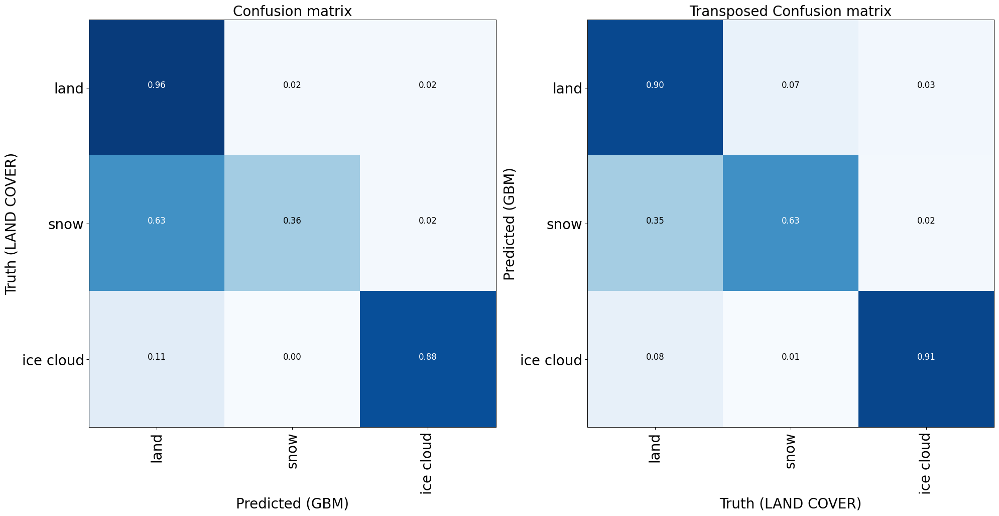

In [95]:
fig = plt.figure(figsize=(20, 20))

plt.subplot(1, 2, 1)
confusion_matrix_gbm = metrics.confusion_matrix(true_labels, predictions)
plot_confusion_matrix(
    confusion_matrix_gbm,
    classes=[name for idx, name in enumerate(class_names) if idx in class_labels],
    normalize=True,
    ylabel="Truth (LAND COVER)",
    xlabel="Predicted (GBM)",
    title="Confusion matrix",
)

plt.subplot(1, 2, 2)
confusion_matrix_gbm = metrics.confusion_matrix(predictions, true_labels)
plot_confusion_matrix(
    confusion_matrix_gbm,
    classes=[name for idx, name in enumerate(class_names) if idx in class_labels],
    normalize=True,
    xlabel="Truth (LAND COVER)",
    ylabel="Predicted (GBM)",
    title="Transposed Confusion matrix",
)

plt.tight_layout()

In [105]:
scores_test = model.predict_proba(X_test)
labels_binarized = preprocessing.label_binarize(y_test, classes=class_labels)

fpr, tpr, roc_auc = {}, {}, {}

for idx, lbl in enumerate(class_labels):
    fpr[idx], tpr[idx], _ = metrics.roc_curve(labels_binarized[:, idx], scores_test[:, idx])
    roc_auc[idx] = metrics.auc(fpr[idx], tpr[idx])


0
1
2


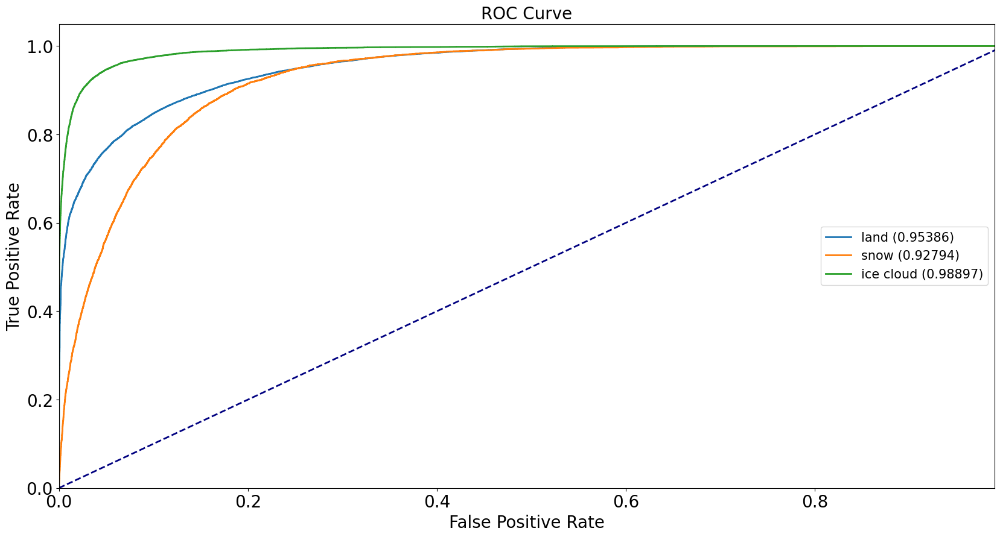

In [106]:
plt.figure(figsize=(20, 10))

for idx, lbl in enumerate(class_labels):
    if np.isnan(roc_auc[idx]):
        continue
    print(idx)
    plt.plot(
        fpr[idx],
        tpr[idx],
        lw=2,
        label=class_names[int(lbl)] + " ({:0.5f})".format(roc_auc[idx]),
    )


plt.plot([0, 1], [0, 1], color="navy", lw=2, linestyle="--")
plt.xlim([0.0, 0.99])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate", fontsize=20)
plt.ylabel("True Positive Rate", fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.title("ROC Curve", fontsize=20)
plt.legend(loc="center right", prop={"size": 15})
plt.show()

## Visualize the results
A map of prediction is now printed to have a human readable idea of the classificator work.

In [107]:
for box in focus_list:
    sample_path = os.path.join(EOPATCH_SAMPLES_FOLDER, f"eopatch_{box}")
    eopatch = EOPatch.load(sample_path, lazy_loading=True)

    input_data = np.concatenate([eopatch.data['FEATURES']])

    t, w, h, l = input_data.shape
    input_data = input_data.reshape(t * w * h, l)

    for index, value in np.ndenumerate(input_data):
        if np.isnan(value):
            input_data[index] = 0
    y_predicted = model.predict(input_data)

    eopatch.data['LABEL_PREDICTED'] = y_predicted.reshape(t, w, h, 1)

    eopatch.save(os.path.join(RESULTS_FOLDER, str('eopatch_'+str(box))), overwrite_permission=OverwritePermission.OVERWRITE_PATCH)

In [108]:
class SNOW_CLOUD_MAP(MultiValueEnum):
    """Enum class containing basic LULC types"""
    NO_SNOW = "Land", 0, "#0DAE26"                  #GREEN
    SNOW_AND_ICE = "Snow and Ice", 1, "#ffffff"     #WHITE
    CLOUD = "cloud", 2, '#ff0000'                   #RED
    @property
    def id(self):
        return self.values[1]
    @property
    def color(self):
        return self.values[2]

# Reference colormap things
snow_cloud_cmap = ListedColormap([x.color for x in SNOW_CLOUD_MAP], name="snow_cloud_cmap")
snow_cloud_norm = BoundaryNorm([x - 0.5 for x in range(len(SNOW_CLOUD_MAP) + 1)], snow_cloud_cmap.N)

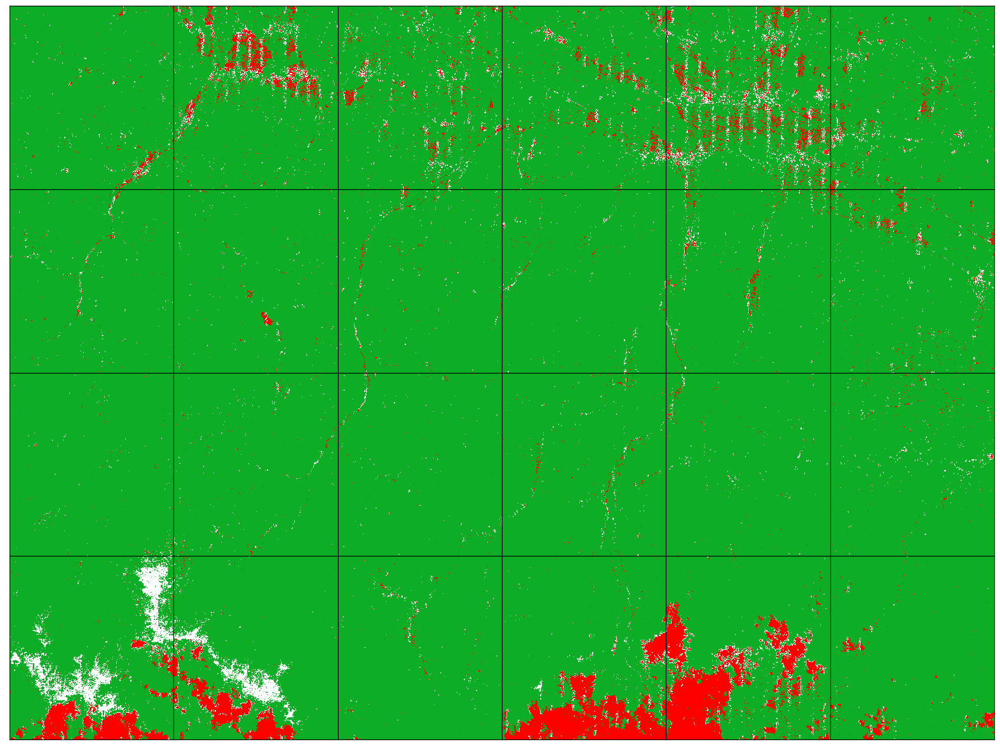

In [109]:
# Visualize the RGB images 

fig, axs = plt.subplots(nrows=4, ncols=6, figsize=(20, 15))

date = datetime.datetime(2020, 1, 30)

for i, patchID in enumerate(focus_list):
    eopatch_path = os.path.join(RESULTS_FOLDER, f"eopatch_{patchID}")
    eopatch = EOPatch.load(eopatch_path, lazy_loading=True)

    dates = np.array([timestamp.replace(tzinfo=None) for timestamp in eopatch.timestamp])
    closest_date_id = np.argsort(abs(date - dates))[0]

    ax = axs[i // 6][i % 6] 
    ax.imshow(np.clip(eopatch.data["BANDS"][closest_date_id][..., [2, 1, 0]] * 3.5, 0, 1))
    ax.imshow(eopatch.data["LABEL_PREDICTED"][closest_date_id].astype(float), cmap= snow_cloud_cmap)
   
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("auto")
    del eopatch

fig.subplots_adjust(wspace=0, hspace=0)



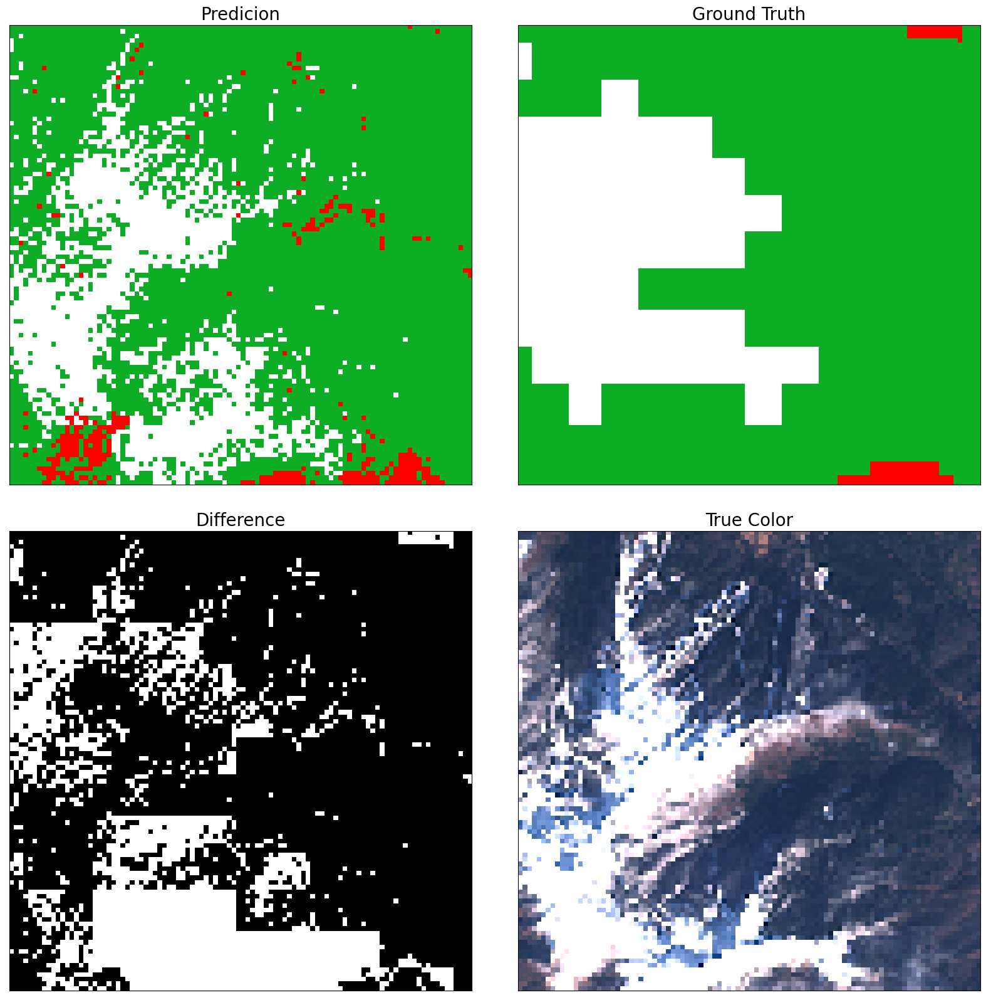

In [119]:
# Draw the Reference map
fig = plt.figure(figsize=(20, 20))

inspect_size = 100

eopatch = EOPatch.load(os.path.join(RESULTS_FOLDER, f"eopatch_{4}"), lazy_loading=True)

date = datetime.datetime(2020, 1, 29)
dates = np.array([timestamp.replace(tzinfo=None) for timestamp in eopatch.timestamp])
closest_date_id = np.argsort(abs(date - dates))[0]

t, y, x, p = eopatch.data['LABEL_PREDICTED'].shape

w_min = np.random.choice(range(y - inspect_size))
w_max = w_min + inspect_size
h_min = np.random.choice(range(x - inspect_size))
h_max = h_min + inspect_size

ax = plt.subplot(2, 2, 1)
plt.imshow(eopatch.data['LABEL_PREDICTED'][closest_date_id][w_min:w_max, h_min:h_max], cmap=snow_cloud_cmap, norm=snow_cloud_norm)
plt.xticks([])
plt.yticks([])
ax.set_aspect("auto")
plt.title("Predicion", fontsize=20)

ax = plt.subplot(2, 2, 2)
plt.imshow(eopatch.data['LABEL'][closest_date_id][w_min:w_max, h_min:h_max], cmap=snow_cloud_cmap, norm=snow_cloud_norm)
plt.xticks([])
plt.yticks([])
ax.set_aspect("auto")
plt.title("Ground Truth", fontsize=20)

ax = plt.subplot(2, 2, 3)
mask = eopatch.data['LABEL_PREDICTED'][closest_date_id] != eopatch.data['LABEL'][closest_date_id]
plt.imshow(mask[w_min:w_max, h_min:h_max], cmap="gray")
plt.xticks([])
plt.yticks([])
ax.set_aspect("auto")
plt.title("Difference", fontsize=20)

ax = plt.subplot(2, 2, 4)
image = np.clip(eopatch.data["FEATURES"][closest_date_id][..., [2, 1, 0]] * 3.5, 0, 1)
plt.imshow(image[w_min:w_max, h_min:h_max])
plt.xticks([])
plt.yticks([])
ax.set_aspect("auto")
plt.title("True Color", fontsize=20)

fig.subplots_adjust(wspace=0.1, hspace=0.1)

## Data Visualization

Data visualization is an important part of data science: it can help the data interpretation, make data more understandable, allowing a view on different levels, and integrate human knowledge to slim data insight. In the specific case of the project, working with maps and geographical images, data visualization is an integrated part of the classification process, needed for reading the results. <br>
The consultation screen will contains all the relevant information to have a clear reference in space and in time of the snow coverage of the AOI. <br>
<ul>
<li>A bar graph shows the amount of snow among the time, to have a rapid view on periods with more snow coverage;</li>
<li>A map shows the details of snow coverage for a single day;</li>
<li>Interactive controls allows the selection of a specific day for the detailed visualization on the map; different modality of visualization are allowed, with the possibility to view the snow coverage, the cloud coverage and both the coverages.</li>
</ul><br>
The Boke library is used for graphs and interaction. (Bokeh at a glance - bokeh documentation. (n.d.). https://bokeh.org )


In [16]:
import sqlite3 as sql
from os.path import dirname, join
from pathlib import Path

from ipywidgets import interact
import matplotlib.image as mpimg
import numpy as np
import pandas

from bokeh.io import curdoc, show, output_notebook, push_notebook
from bokeh.layouts import column, layout, row
from bokeh.models import ColumnDataSource, Div, Select, Slider, TextInput,FactorRange, Button, Paragraph
from bokeh.plotting import figure
from bokeh.transform import dodge, factor_cmap
from bokeh.palettes import Paired10, Turbo256, Spectral
from bokeh.core.properties import value

import string
from _ast import In
from bokeh.core.query import IN
from pandas.core.reshape.reshape import _Unstacker

The following functions create a dictionary that relates the amount of snow for each day of the year.

In [17]:
day_time_list = []
for box in focus_list:
    sample_path = os.path.join(RESULTS_FOLDER, f"eopatch_{box}")
    eopatch = EOPatch.load(sample_path, lazy_loading=True)
    day_time_list.append(eopatch.timestamp)
    del eopatch
day_list = [day.date() for day in np.concatenate(day_time_list)]
day_list = list(dict.fromkeys(day_list));


In [18]:
snow_amount = {}
for day in day_list:
    daily_amount = 0
    for box in focus_list:
        sample_path = os.path.join(RESULTS_FOLDER, f"eopatch_{box}")
        eopatch = EOPatch.load(sample_path, lazy_loading=True)

        dates = np.array([timestamp.replace(tzinfo=None).date() for timestamp in eopatch.timestamp])
        closest_date_id = np.argsort(abs(day - dates))[0]

        daily_amount += eopatch.mask_timeless['REAL_DATA_SNOW_COUNT'][closest_date_id][0][0].astype(float)
    snow_amount.update({day.strftime("%x") : daily_amount})


In [19]:
class SNOW_MAP(MultiValueEnum):
    """Enum class containing basic LULC types"""
    NO_SNOW = "Land", 0, "#0DAE26"
    SNOW_AND_ICE = "Snow and Ice", 1, "#ffffff"
    CLOUD = "cloud", 2, '#0DAE25'
    @property
    def id(self):
        return self.values[1]
    @property
    def color(self):
        return self.values[2]

# Reference colormap things
snow_cmap = ListedColormap([x.color for x in SNOW_MAP], name="snow_cmap")
snow_norm = BoundaryNorm([x - 0.5 for x in range(len(SNOW_MAP) + 1)], snow_cmap.N)

In [20]:
class CLOUD_MAP(MultiValueEnum):
    """Enum class containing basic LULC types"""
    NO_SNOW = "Land", 0, "#0DAE26"
    SNOW_AND_ICE = "Snow and Ice", 1, "#0DAE25"
    CLOUD = "cloud", 2, '#ff0000'
    @property
    def id(self):
        return self.values[1]
    @property
    def color(self):
        return self.values[2]

# Reference colormap things
cloud_cmap = ListedColormap([x.color for x in CLOUD_MAP], name="cloud_cmap")
cloud_norm = BoundaryNorm([x - 0.5 for x in range(len(CLOUD_MAP) + 1)], cloud_cmap.N)

In [21]:
class SNOW_CLOUD_MAP(MultiValueEnum):
    """Enum class containing basic LULC types"""
    NO_SNOW = "Land", 0, "#0DAE26"
    SNOW_AND_ICE = "Snow and Ice", 1, "#ffffff"
    CLOUD = "cloud", 2, '#ff0000'
    @property
    def id(self):
        return self.values[1]
    @property
    def color(self):
        return self.values[2]

# Reference colormap things
snow_cloud_cmap = ListedColormap([x.color for x in SNOW_CLOUD_MAP], name="snow_cloud_cmap")
snow_cloud_norm = BoundaryNorm([x - 0.5 for x in range(len(SNOW_CLOUD_MAP) + 1)], snow_cloud_cmap.N)

In [22]:
os.makedirs(os.path.join(RESULTS_FOLDER, 'images'), exist_ok=True)
output_notebook()

desc = Div(text=open("description.html").read(), sizing_mode="stretch_width")
'''
# Create Input controls

selected_modality = Select(title="Select municipality", options=sorted(['snow', 'cloud', 'snow & cloud']), value="snow")
selected_date = Select(title="Select date", options=sorted([day.strftime("%x") for day in day_list]), value=day_list[0].strftime("%x"))'''

# Create Column Data Source that will be used by the plot
source = ColumnDataSource(data=dict(date=[d for d in snow_amount.keys()], amount = [v for v in snow_amount.values()], colors = ['green' for i in range(len(snow_amount.keys()))]))
'''
TOOLTIPS=[
    ("Day", "@day"),
    ("Snow Amount", "@amount")
]'''

#p = figure(height=600, width=700, title="", toolbar_location=None, sizing_mode="scale_both")
x = [k for k in snow_amount.keys()]
p = figure(x_range=FactorRange(*x), height=300, width=1000, title="", toolbar_location=None, tools="")
p.xaxis.major_label_orientation = "vertical"
p.vbar(x='date', top='amount', width=0.9, source=source, color = 'colors')
#p.circle(x="x", y="y", source=source, size=7, color="color", line_color=None, fill_alpha="alpha")

image = Div(text='', sizing_mode="stretch_width")

def update(day, modality):
    
    for index, day_selected in enumerate(day_list):
        if day_selected.strftime("%x") == day:
            break
    
    fig, axs = plt.subplots(nrows=4, ncols=6, figsize=(15, 10));

    for i, patchID in enumerate(focus_list):
        eopatch_path = os.path.join(RESULTS_FOLDER, f"eopatch_{patchID}")
        eopatch = EOPatch.load(eopatch_path, lazy_loading=True)

        dates = np.array([timestamp.replace(tzinfo=None).date() for timestamp in eopatch.timestamp])
        closest_date_id = np.argsort(abs(day_selected - dates))[0]

        ax = axs[i // 6][i % 6] 
        if modality == 'snow':
            ax.imshow(eopatch.data["LABEL_PREDICTED"][closest_date_id].astype(float), cmap= snow_cmap);
        elif modality == 'cloud':
            ax.imshow(eopatch.data["LABEL_PREDICTED"][closest_date_id].astype(float), cmap= cloud_cmap);
        elif modality == 'snow&cloud':
            ax.imshow(eopatch.data["LABEL_PREDICTED"][closest_date_id].astype(float), cmap= snow_cloud_cmap);
    
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_aspect("auto")
        del eopatch
    fig.subplots_adjust(wspace=0, hspace=0)
    fig.savefig(os.path.join(RESULTS_FOLDER, os.path.join('images', 'temp_image.png')))
    
   
    p.title.text = str(str(modality) + 'map for the day: '+ str(day))
    color_selected = ['red' for i in range(len(snow_amount.keys()))]
    color_selected[index] = 'green'
    source.data = dict(
        date=[d for d in snow_amount.keys()], 
        amount = [v for v in snow_amount.values()], 
        colors = color_selected
    )

    
    image = Div(text=open(os.path.join(RESULTS_FOLDER, os.path.join('images', 'temp_image.png')), encoding='utf8', errors='ignore').read(), sizing_mode="stretch_width")
    
    push_notebook()
    

#l = column(desc, p, image, sizing_mode="scale_both")

#update()  # initial load of the data

show(column(desc, p, image), notebook_handle=True)
interact(update, day = [day.strftime("%x") for day in day_list], modality = ['snow', 'cloud', 'snow&cloud'])




Loading BokehJS ...

interactive(children=(Dropdown(description='day', options=('11/05/19', '11/10/19', '11/13/19', '11/28/19', '11…

<function __main__.update(day, modality)>

61


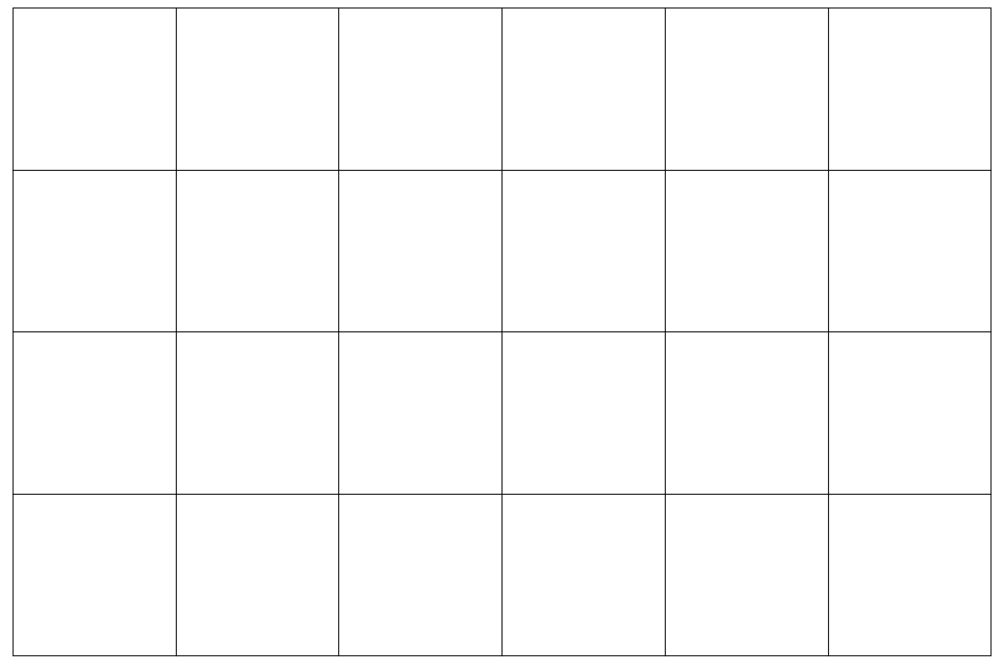

interactive(children=(Output(),), _dom_classes=('widget-interact',))

AttributeError: 'function' object has no attribute 'references'

In [23]:
'''
BOKEH ON A WEB APPLICATION
NOT WORKING

'''


os.makedirs(os.path.join(RESULTS_FOLDER, 'images'), exist_ok=True)
#output_notebook()

desc = Div(text=open("description.html").read(), sizing_mode="stretch_width")

# Create Input controls

selected_modality = Select(title="Select municipality", options=sorted(['snow', 'cloud', 'snow & cloud']), value="snow")
selected_date = Select(title="Select date", options=sorted([day.strftime("%x") for day in day_list]), value=day_list[0].strftime("%x"))

# Create Column Data Source that will be used by the plot
source = ColumnDataSource(data=dict(date=[d for d in snow_amount.keys()], amount = [v for v in snow_amount.values()], colors = ['green' for i in range(len(snow_amount.keys()))]))

TOOLTIPS=[
    ("Day", "@date"),
    ("Snow Amount (m^3)", "@amount")
]

#p = figure(height=600, width=700, title="", toolbar_location=None, sizing_mode="scale_both")
x = [k for k in snow_amount.keys()]
p = figure(x_range=FactorRange(*x), height=300, width=1000, title="", toolbar_location=None, tools="", tooltips=TOOLTIPS)
p.xaxis.major_label_orientation = "vertical"
p.vbar(x='date', top='amount', width=0.9, source=source, color = 'colors')
#p.circle(x="x", y="y", source=source, size=7, color="color", line_color=None, fill_alpha="alpha")

image = Div(text='', sizing_mode="stretch_width")

def update():
    
    day = selected_date
    modality = selected_modality
    print(len(snow_amount.keys()))

    for index, day_selected in enumerate(day_list):
        if day_selected.strftime("%x") == day:
            break
    
    
    fig, axs = plt.subplots(nrows=4, ncols=6, figsize=(15, 10));

    for i, patchID in enumerate(focus_list):
        eopatch_path = os.path.join(RESULTS_FOLDER, f"eopatch_{patchID}")
        eopatch = EOPatch.load(eopatch_path, lazy_loading=True)

        dates = np.array([timestamp.replace(tzinfo=None).date() for timestamp in eopatch.timestamp])
        closest_date_id = np.argsort(abs(day_selected - dates))[0]

        ax = axs[i // 6][i % 6] 
        if modality == 'snow':
            ax.imshow(eopatch.data["LABEL_PREDICTED"][closest_date_id].astype(float), cmap= snow_cmap);
        elif modality == 'cloud':
            ax.imshow(eopatch.data["LABEL_PREDICTED"][closest_date_id].astype(float), cmap= cloud_cmap);
        elif modality == 'snow&cloud':
            ax.imshow(eopatch.data["LABEL_PREDICTED"][closest_date_id].astype(float), cmap= snow_cloud_cmap);
    
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_aspect("auto")
        del eopatch
    fig.subplots_adjust(wspace=0, hspace=0)
    fig.savefig(os.path.join(RESULTS_FOLDER, os.path.join('images', 'temp_image.png')))
    
   
    p.title.text = str(str(modality) + 'map for the day: '+ str(day))
    color_selected = ['red' for i in range(len(snow_amount.keys()))]
    color_selected[index] = 'green'
    source.data = dict(
        date=[d for d in snow_amount.keys()], 
        amount = [v for v in snow_amount.values()], 
        colors = color_selected
    )

    
    image = Div(text=open(os.path.join(RESULTS_FOLDER, os.path.join('images', 'temp_image.png')), encoding='utf8', errors='ignore').read(), sizing_mode="stretch_width")
    
    #push_notebook()
    

l = column(desc, p, image, sizing_mode="scale_both")

update()  # initial load of the data

show(column(desc, p, image), notebook_handle=True)
interact(update, day = [day.strftime("%x") for day in day_list], modality = ['snow', 'cloud', 'snow&cloud'])
curdoc().add_root(layout)
curdoc().title = ""

